In [2]:
from sklearn.datasets import load_boston

dataset = load_boston()

In [3]:
import pandas as pd

def load_dataframe(dataset):
    df = pd.DataFrame(dataset['data'], columns=dataset['feature_names'])
    df['MEDV (target)'] = dataset['target']
    return df
	

boston_dataframe = load_dataframe(dataset)

print(boston_dataframe[:20])

       CRIM    ZN  INDUS  CHAS    NOX     RM    AGE     DIS  RAD    TAX  \
0   0.00632  18.0   2.31   0.0  0.538  6.575   65.2  4.0900  1.0  296.0   
1   0.02731   0.0   7.07   0.0  0.469  6.421   78.9  4.9671  2.0  242.0   
2   0.02729   0.0   7.07   0.0  0.469  7.185   61.1  4.9671  2.0  242.0   
3   0.03237   0.0   2.18   0.0  0.458  6.998   45.8  6.0622  3.0  222.0   
4   0.06905   0.0   2.18   0.0  0.458  7.147   54.2  6.0622  3.0  222.0   
5   0.02985   0.0   2.18   0.0  0.458  6.430   58.7  6.0622  3.0  222.0   
6   0.08829  12.5   7.87   0.0  0.524  6.012   66.6  5.5605  5.0  311.0   
7   0.14455  12.5   7.87   0.0  0.524  6.172   96.1  5.9505  5.0  311.0   
8   0.21124  12.5   7.87   0.0  0.524  5.631  100.0  6.0821  5.0  311.0   
9   0.17004  12.5   7.87   0.0  0.524  6.004   85.9  6.5921  5.0  311.0   
10  0.22489  12.5   7.87   0.0  0.524  6.377   94.3  6.3467  5.0  311.0   
11  0.11747  12.5   7.87   0.0  0.524  6.009   82.9  6.2267  5.0  311.0   
12  0.09378  12.5   7.87 

In [4]:
def count_missing_values(df):
	return df.isnull().sum()

print(count_missing_values(boston_dataframe))

CRIM             0
ZN               0
INDUS            0
CHAS             0
NOX              0
RM               0
AGE              0
DIS              0
RAD              0
TAX              0
PTRATIO          0
B                0
LSTAT            0
MEDV (target)    0
dtype: int64


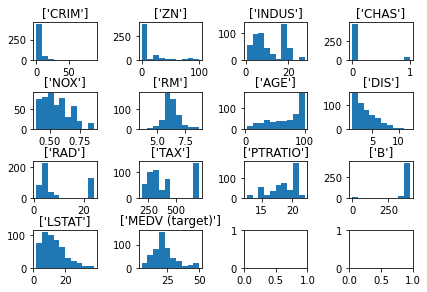

In [5]:
import matplotlib.pyplot as plt

def plot_histograms(df):
    fig, axs = plt.subplots(4,4)
    fig.tight_layout()
    col_names = df.columns
    k = 0
    for i in range(4):
        for j in range(4):
            if k < len(col_names):
                axs[i,j].hist(df[col_names[k]])
                axs[i,j].set_title([col_names[k]])
            k += 1
    
    plt.show()


plot_histograms(boston_dataframe)


<b> Looking for Correlations </b>

In [9]:
def compute_correlations_matrix(boston_dataframe):
	return boston_dataframe.corr(method='pearson')

correlations = compute_correlations_matrix(boston_dataframe)

print(correlations['MEDV (target)'])

CRIM            -0.388305
ZN               0.360445
INDUS           -0.483725
CHAS             0.175260
NOX             -0.427321
RM               0.695360
AGE             -0.376955
DIS              0.249929
RAD             -0.381626
TAX             -0.468536
PTRATIO         -0.507787
B                0.333461
LSTAT           -0.737663
MEDV (target)    1.000000
Name: MEDV (target), dtype: float64


In [11]:
# What is the correlation coefficient between the median value and the number of rooms?
print(correlations['MEDV (target)']['RM'])

0.6953599470715389


In [20]:
#Which attribute is the most negatively correlated with the median value?
print(correlations['MEDV (target)'].idxmin())

LSTAT


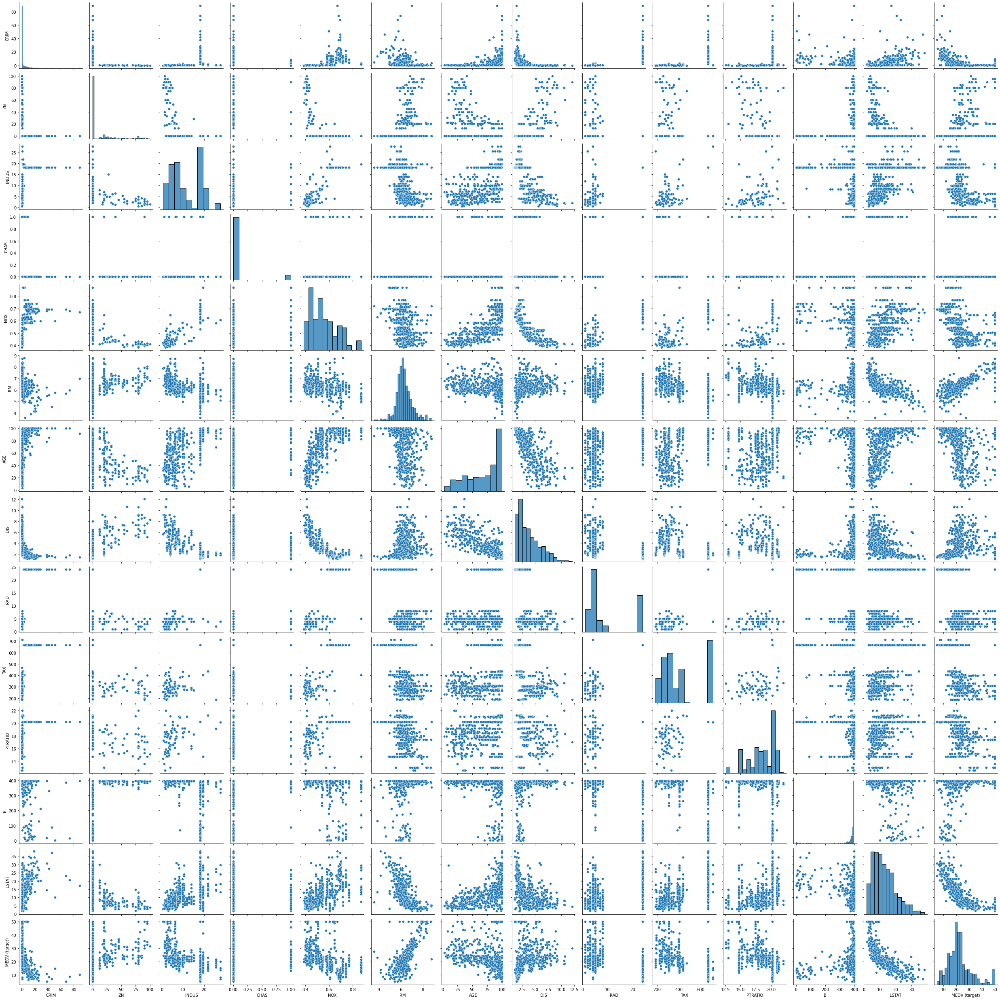

In [21]:
### Correlation matrix graphs
import seaborn as sns
sns.pairplot(boston_dataframe)

<AxesSubplot:xlabel='MEDV (target)', ylabel='RM'>

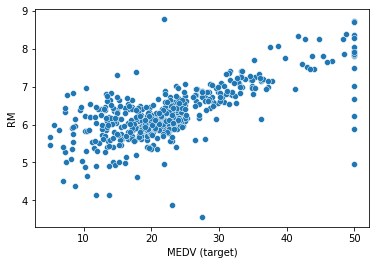

In [24]:
# Plot MEDV in function of RM
sns.scatterplot(x=boston_dataframe['MEDV (target)'], y=boston_dataframe['RM'])

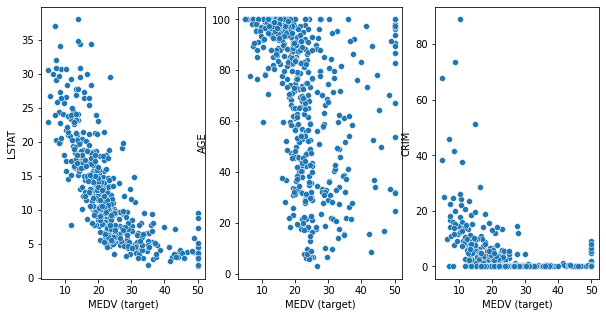

In [27]:
# Plot the correlation scatter plot of the median value against LSTAT, AGE, and CRIME.
l = ['LSTAT', 'AGE', 'CRIM']
fig, axs = plt.subplots(1,3, figsize=(10,5))
for i in range(3):
    sns.scatterplot(x=boston_dataframe['MEDV (target)'], y=boston_dataframe[l[i]], ax = axs[i])

In [28]:
# Correlation for LSTAT
print(correlations['LSTAT'])

CRIM             0.455621
ZN              -0.412995
INDUS            0.603800
CHAS            -0.053929
NOX              0.590879
RM              -0.613808
AGE              0.602339
DIS             -0.496996
RAD              0.488676
TAX              0.543993
PTRATIO          0.374044
B               -0.366087
LSTAT            1.000000
MEDV (target)   -0.737663
Name: LSTAT, dtype: float64


In [ ]:
l = ['INDUS', 'RM', 'AGE']
fig, axs = plt.subplots(1,3, figsize=(10,5))
for i in range(3):
    sns.scatterplot(x=boston_dataframe['LSTAT'], y=boston_dataframe[l[i]], ax = axs[i])